In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Đọc dữ liệu
data = pd.read_csv('../datas/train_div10.csv')
data_test = pd.read_csv('../datas/test_div10.csv')

In [10]:
import sys
sys.path.append('../extraction')  

from extraction import (
    create_training_data,
    calculate_accelerometer_features,
    calculate_accelerometer_fft_features,
)

x_list, y_list, z_list, train_labels = create_training_data(
    data=data, window_size=20, step_size=10)

x_list_test, y_list_test, z_list_test, train_labels_test = create_training_data(
    data=data_test, window_size=20, step_size=10)



In [11]:
features = calculate_accelerometer_features(
    x_list=x_list, y_list=y_list, z_list=z_list, window_size=20)
# test
features_test = calculate_accelerometer_features(
    x_list=x_list_test, y_list=y_list_test, z_list=z_list_test, window_size=20)

c:\Users\Admin\Desktop\Master_2024\new_sleep_posture_2025\train\../extraction\extraction.py:102: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  X_train['x_skewness'] = [stats.skew(x) for x in x_list]
c:\Users\Admin\Desktop\Master_2024\new_sleep_posture_2025\train\../extraction\extraction.py:103: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  X_train['y_skewness'] = [stats.skew(y) for y in y_list]
c:\Users\Admin\Desktop\Master_2024\new_sleep_posture_2025\train\../extraction\extraction.py:104: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  X_train['z_skewness'] = [stats.skew(z) for z in z_list]
c:\Users\Admin\Desktop

In [12]:
features = features[['x_mean', 'y_mean', 'z_mean', 'x_std', 'y_std', 'z_std', 'x_aad',
                     'y_aad', 'z_aad', 'x_median', 'y_median', 'z_median', 'x_mad', 'y_mad', 'z_mad', 'x_IQR', 'y_IQR',
                     'z_IQR', 'x_neg_count', 'y_neg_count', 'z_neg_count', 'x_pos_count',
                     'y_pos_count', 'z_pos_count', 'x_above_mean', 'y_above_mean', 'z_above_mean', 'x_peak_count', 'y_peak_count', 'z_peak_count',
                     'x_skewness', 'y_skewness', 'z_skewness', 'x_kurtosis', 'y_kurtosis',
                     'z_kurtosis', 'x_energy', 'y_energy', 'z_energy', 'avg_result_accl',
                     'sma']]


features_test = features_test[['x_mean', 'y_mean', 'z_mean', 'x_std', 'y_std', 'z_std', 'x_aad',
                     'y_aad', 'z_aad', 'x_median', 'y_median', 'z_median', 'x_mad', 'y_mad', 'z_mad', 'x_IQR', 'y_IQR',
                     'z_IQR', 'x_neg_count', 'y_neg_count', 'z_neg_count', 'x_pos_count',
                     'y_pos_count', 'z_pos_count', 'x_above_mean', 'y_above_mean', 'z_above_mean', 'x_peak_count', 'y_peak_count', 'z_peak_count',
                     'x_skewness', 'y_skewness', 'z_skewness', 'x_kurtosis', 'y_kurtosis',
                     'z_kurtosis', 'x_energy', 'y_energy', 'z_energy', 'avg_result_accl',
                     'sma']]


In [13]:
# Kiểm tra có bao nhiêu giá trị NaN
print("🔍 Số NaN trong mỗi cột:")
features_all = features
features_all_test= features_test
print(features_all.isna().sum().sort_values(ascending=False).head(10))

🔍 Số NaN trong mỗi cột:
x_kurtosis      1112
x_skewness      1112
y_skewness       679
y_kurtosis       679
z_kurtosis       206
z_skewness       206
y_peak_count       0
z_pos_count        0
x_above_mean       0
y_above_mean       0
dtype: int64


In [14]:
features_all = features_all.fillna(features_all.mean())
features_all_test = features_all_test.fillna(features_all_test.mean())

🌲 Training Random Forest (optimized)...
🎯 Test Accuracy: 0.9938
              precision    recall  f1-score   support

           1       1.00      0.99      1.00      2863
           2       0.98      1.00      0.99       805
           3       1.00      1.00      1.00      2417
           4       1.00      0.95      0.97       240

    accuracy                           0.99      6325
   macro avg       0.99      0.98      0.99      6325
weighted avg       0.99      0.99      0.99      6325



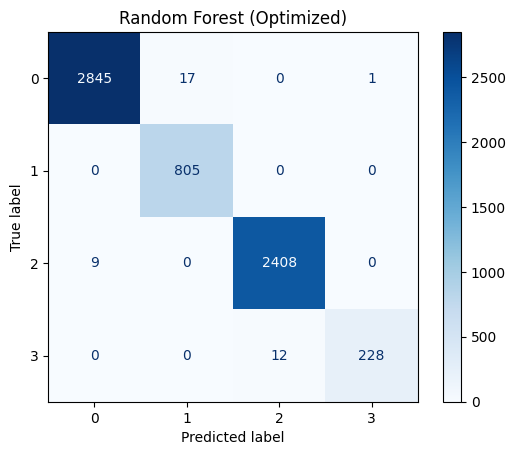

In [15]:
from models import train_RF
modelRF = train_RF(features_all, features_all_test, train_labels, train_labels_test)


PermutationExplainer explainer: 15675it [11:54, 21.65it/s]                           


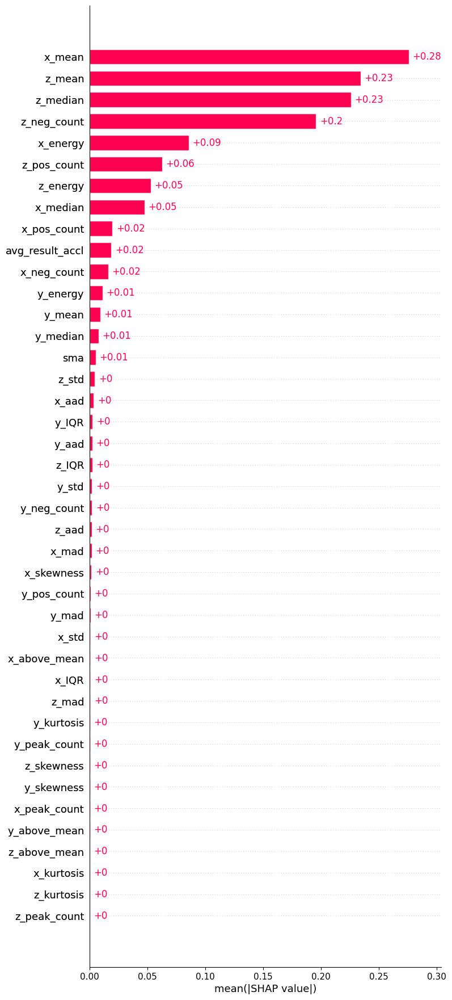

In [16]:
import shap

explainer = shap.Explainer(modelRF.predict, features_all)
shap_values = explainer(features_all)
shap.plots.bar(shap_values, max_display=50)

📈 Training Logistic Regression (optimized)...
🎯 Test Accuracy: 0.9662
              precision    recall  f1-score   support

           1       1.00      0.93      0.96      2863
           2       0.86      1.00      0.92       805
           3       0.97      1.00      0.98      2417
           4       1.00      0.99      0.99       240

    accuracy                           0.97      6325
   macro avg       0.96      0.98      0.97      6325
weighted avg       0.97      0.97      0.97      6325



C:\Users\Admin\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\linear_model\_logistic.py:1281: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


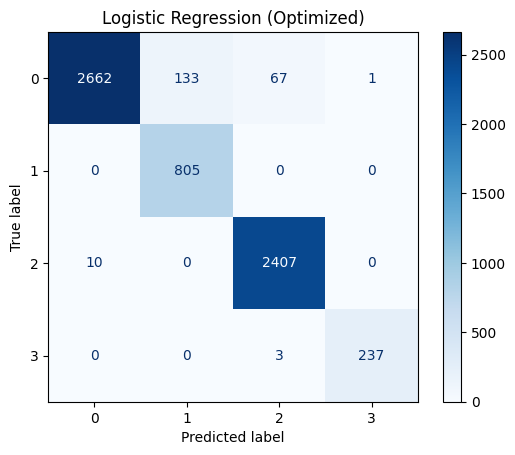

In [17]:
from models import train_LR
modelLR, scalerLr = train_LR(features_all, features_all_test, train_labels, train_labels_test)

C:\Users\Admin\AppData\Local\Temp\ipykernel_16804\3678493678.py:17: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_scaled, plot_type="bar", max_display=50)


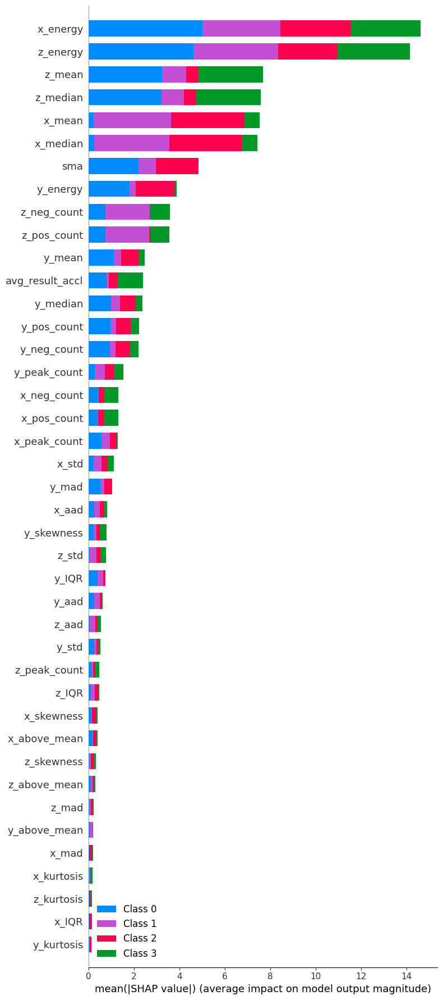

In [18]:
import shap
import pandas as pd

# ⚙️ Bước 1: Đảm bảo features_all là DataFrame có tên cột
# (bạn đã làm đúng ở trên với features và features_fft)
# ⚠️ Tuy nhiên sau khi chuẩn hóa, cần gắn lại tên cột:
X_scaled = scalerLr.transform(features_all)
X_scaled = pd.DataFrame(X_scaled, columns=features_all.columns)

# ⚙️ Bước 2: Tạo LinearExplainer
explainer = shap.LinearExplainer(modelLR, X_scaled, feature_names=features_all.columns)

# ⚙️ Bước 3: Tính SHAP values
shap_values = explainer.shap_values(X_scaled)

# ⚙️ Bước 4: Vẽ biểu đồ SHAP
shap.summary_plot(shap_values, X_scaled, plot_type="bar", max_display=50)

💡 Training SVM (optimized)...
🎯 Test Accuracy: 0.9393
              precision    recall  f1-score   support

           1       1.00      0.87      0.93      2863
           2       0.84      1.00      0.91       805
           3       0.92      1.00      0.96      2417
           4       1.00      0.99      0.99       240

    accuracy                           0.94      6325
   macro avg       0.94      0.96      0.95      6325
weighted avg       0.95      0.94      0.94      6325



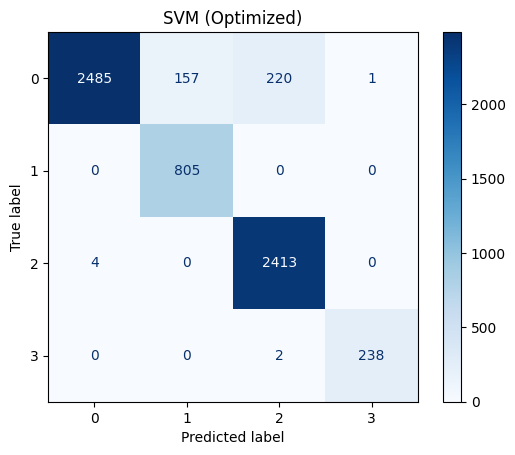

In [19]:
from models import train_SVM
modelSVM, scalerSVM = train_SVM(features_all, features_all_test, train_labels, train_labels_test)

In [20]:
import shap
import numpy as np
import pandas as pd
X_train_scaled = scalerSVM.transform(features_all)
X_test_scaled = scalerSVM.transform(features_all_test)
explainer = shap.KernelExplainer(modelSVM.predict, X_train_scaled[:200])  # dùng 200 mẫu đầu làm background (để tiết kiệm thời gian)

# ⚙️ Tính giá trị SHAP
shap_values = explainer.shap_values(X_test_scaled[:300])  # có thể giới hạn 300 mẫu test để tránh tính lâu


Using 200 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|██████████| 300/300 [03:41<00:00,  1.36it/s]


C:\Users\Admin\AppData\Local\Temp\ipykernel_16804\1027837958.py:5: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test_scaled_df, plot_type="bar", max_display=30)


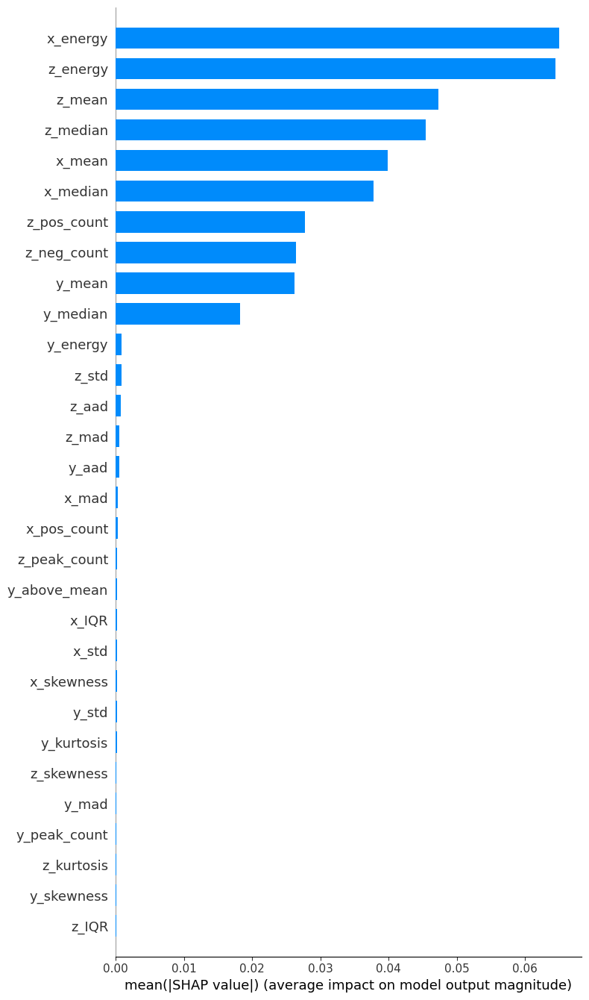

In [21]:
# Chuyển test set thành DataFrame có tên cột
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=features_all.columns)

# Vẽ bar chart (top 30 feature quan trọng nhất)
shap.summary_plot(shap_values, X_test_scaled_df, plot_type="bar", max_display=30)


🔥 Training Gradient Boosting (optimized)...
🎯 Test Accuracy: 0.9968
              precision    recall  f1-score   support

           1       1.00      1.00      1.00      2863
           2       1.00      1.00      1.00       805
           3       1.00      1.00      1.00      2417
           4       1.00      0.97      0.99       240

    accuracy                           1.00      6325
   macro avg       1.00      0.99      0.99      6325
weighted avg       1.00      1.00      1.00      6325



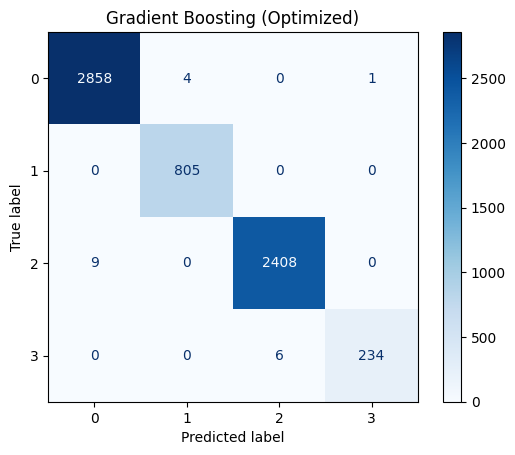

In [22]:
from models import train_GB
modelGB, scalerGB = train_GB(features_all, features_all_test, train_labels, train_labels_test)


In [23]:
import shap
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Chuẩn hóa dữ liệu như khi train
X_train_scaled_gb = scalerGB.transform(features_all)
X_test_scaled_gb = scalerGB.transform(features_all_test)

X_train_scaled_gb = pd.DataFrame(X_train_scaled_gb, columns=features_all.columns)
X_test_scaled_gb = pd.DataFrame(X_test_scaled_gb, columns=features_all.columns)

# ⚙️ Tạo Explainer dùng hàm dự đoán (predict_proba) thay vì truyền model
explainer = shap.Explainer(modelGB.predict_proba, X_train_scaled_gb)

# ⚙️ Tính giá trị SHAP
shap_values = explainer(X_test_scaled_gb)




C:\Users\Admin\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\utils\validation.py:2742: UserWarning: X has feature names, but GradientBoostingClassifier was fitted without feature names
  warnings.warn(
C:\Users\Admin\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\utils\validation.py:2742: UserWarning: X has feature names, but GradientBoostingClassifier was fitted without feature names
  warnings.warn(
C:\Users\Admin\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\utils\validation.py:2742: UserWarning: X has feature names, but GradientBoostingClassifier was fitted without feature names
  warnings.warn(
C:\Users\Admin\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packag

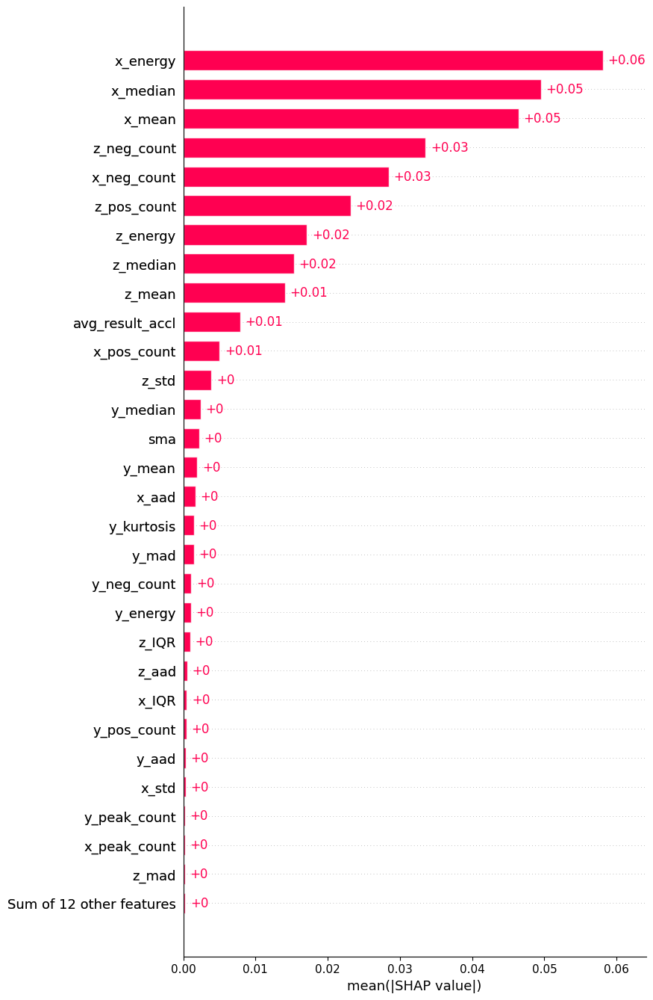

In [24]:
import numpy as np
import shap

# Lấy trị tuyệt đối rồi trung bình theo toàn bộ lớp
shap_values_mean = np.mean(np.abs(shap_values.values), axis=2)

# Tạo lại một đối tượng Explanation 2D để vẽ
shap_values_combined = shap.Explanation(
    values=shap_values_mean,
    base_values=shap_values.base_values.mean(axis=1),
    data=shap_values.data,
    feature_names=shap_values.feature_names
)

# Vẽ biểu đồ “global importance”
shap.plots.bar(shap_values_combined, max_display=30)